In [2]:
%%capture
!pip install shap
!pip install lime

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import sklearn


import torch
import torch.nn as nn
from torch import Tensor
import torch.optim as optim
import torchvision
import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import Subset, DataLoader
from torch.utils.data import random_split
import json
from torch.optim import lr_scheduler
import torch.nn.functional as F
import torchvision
from torchvision import datasets, models, transforms
import time
import copy
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import LabelEncoder

import warnings
from warnings import filterwarnings
filterwarnings("ignore")

# Part 1

## 1

### A

In [6]:
df = pd.read_csv("diabetes.csv")
df.head(5)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


Text(0.5, 1.0, 'Correlation Plot')

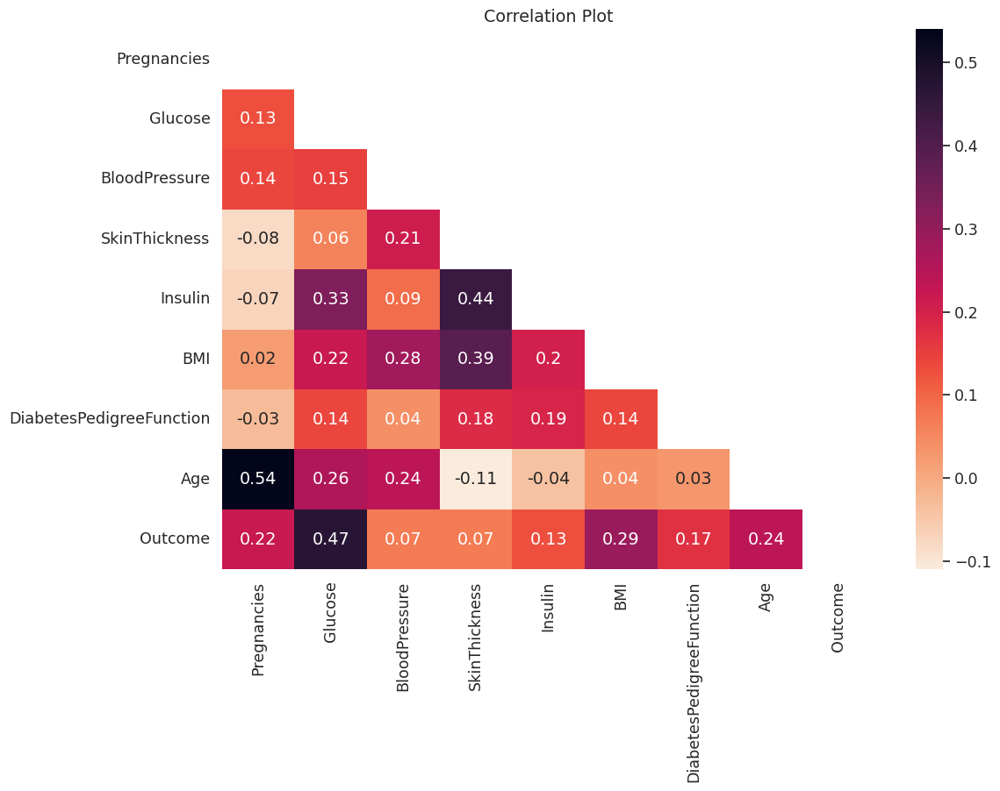

In [8]:
# Calculate the correlation matrix
correlation_matrix = df.corr().round(2)

# Print or display the correlation matrix
# print(correlation_matrix)
plt.figure(figsize=(12, 8))
sns.set(font_scale=1.15)

sns.set_palette("bright")
sns.set_style("white")
mask = np.zeros_like(correlation_matrix)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(correlation_matrix, annot=True, cmap="rocket_r", mask=mask, cbar=True)
plt.title('Correlation Plot')



# sns.heatmap(correlation_matrix,cmap="rocket_r",annot=False)
# plt.show()

[]

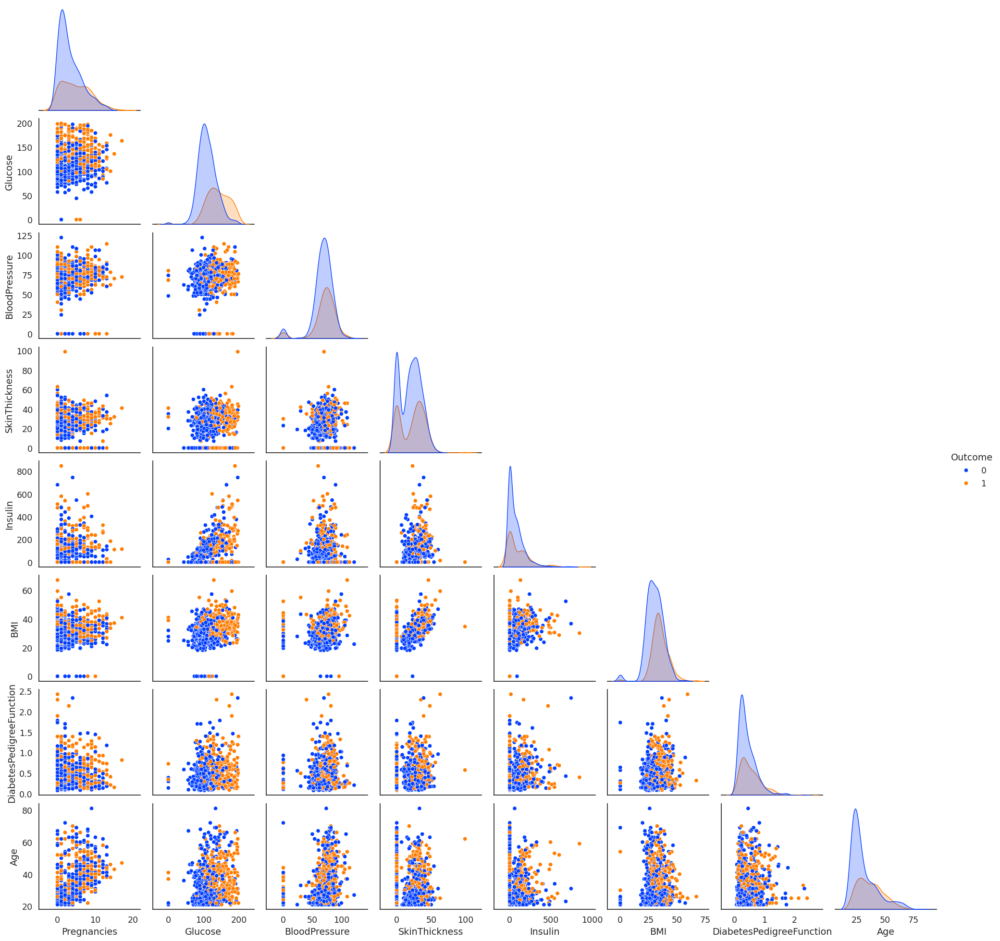

In [9]:
sns.pairplot(df, corner=True, hue='Outcome')
plt.plot()

### B

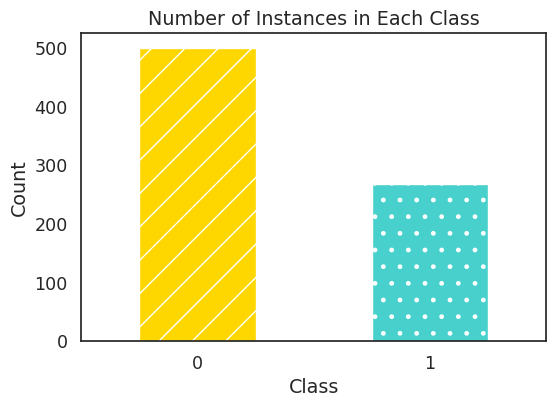

In [10]:
class_counts = df['Outcome'].value_counts()

# Plot the bar plot
colors = ['green', 'red']
colors = ['gold', 'mediumturquoise']
plt.figure(figsize=(6, 4))
class_counts.plot(kind='bar', color=colors, hatch=['/', '.'])
plt.title('Number of Instances in Each Class')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()

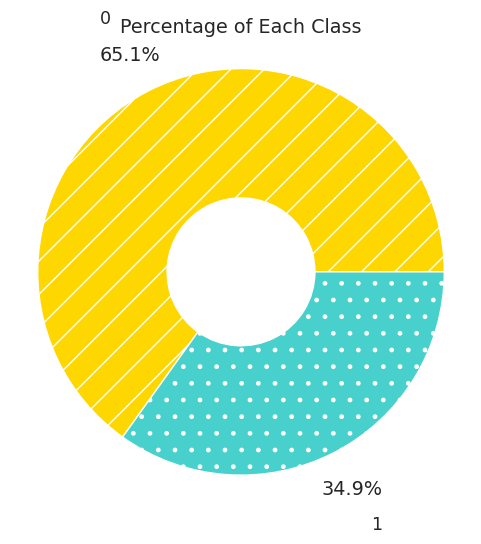

In [11]:
plt.figure(figsize=(6, 6))
plt.pie(class_counts, labels=class_counts.index, autopct='%1.1f%%', startangle=0, colors=colors, hatch=['/', '.'], pctdistance=1.2, labeldistance=1.4,
        radius=1.1, wedgeprops=dict(width=0.7))
plt.title('Percentage of Each Class')
plt.show()

### C

In [12]:
# Specify the column you want to process
target_columns = ['BloodPressure', 'BMI', 'Glucose', 'SkinThickness']
for target_column in target_columns:
    # Calculate the average of non-zero values in the target column
    non_zero_values = df[target_column][df[target_column] != 0]
    column_average = non_zero_values.mean()

    # Replace zeros with the computed average
    df[target_column] = df[target_column].replace(0, np.round(column_average,1))

[]

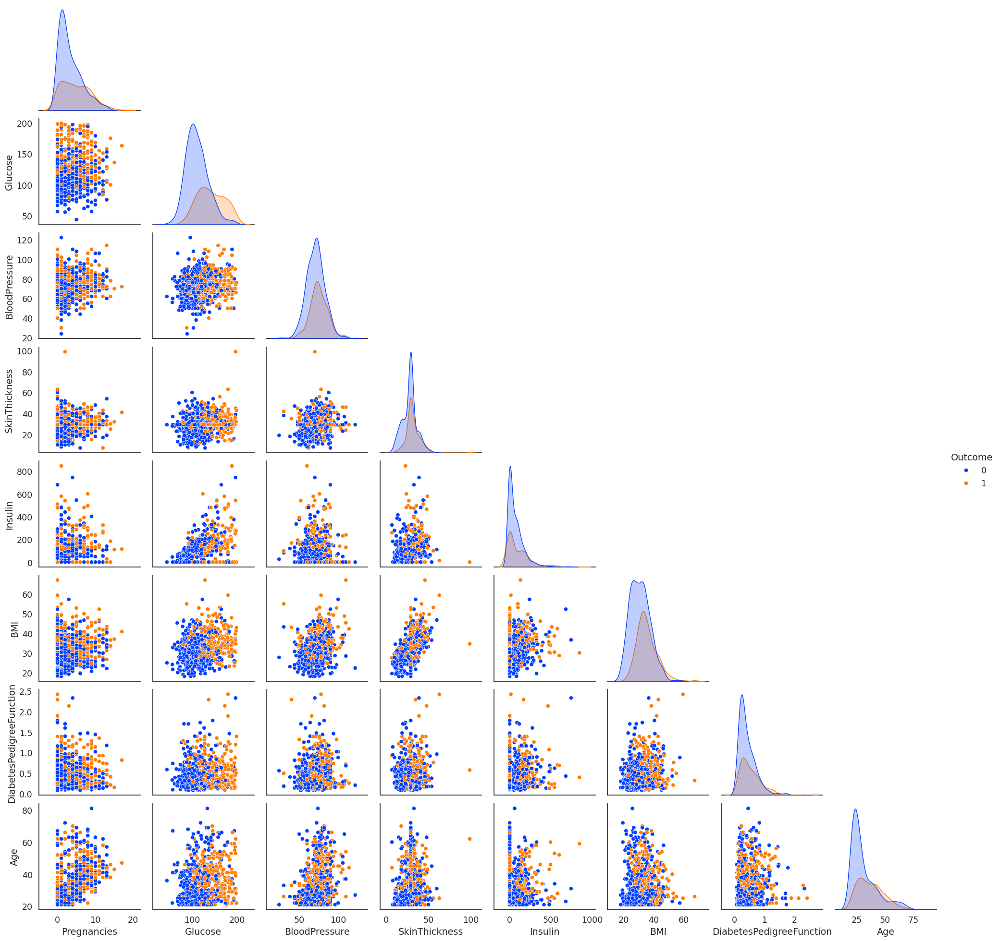

In [13]:
sns.pairplot(df, corner=True, hue='Outcome')
plt.plot()

## 2

In [14]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
normalized_data = scaler.fit_transform(df)
data = pd.DataFrame(normalized_data, columns=df.columns)
data.head(5)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.352941,0.670968,0.489796,0.304348,0.000000,0.314928,0.234415,0.483333,1.0
1,0.058824,0.264516,0.428571,0.239130,0.000000,0.171779,0.116567,0.166667,0.0
2,0.470588,0.896774,0.408163,0.241304,0.000000,0.104294,0.253629,0.183333,1.0
3,0.058824,0.290323,0.428571,0.173913,0.111111,0.202454,0.038002,0.000000,0.0
4,0.000000,0.600000,0.163265,0.304348,0.198582,0.509202,0.943638,0.200000,1.0


In [15]:
from sklearn.model_selection import StratifiedShuffleSplit

# Assuming X contains your features and y contains your target variable (class)
X = data.drop(columns=['Outcome'])  # Features
y = data['Outcome']  # Target variable

# Define the proportion of data for each set (train, validation, test)
train_size = 0.7
val_size = 0.1
test_size = 0.2

# Initialize StratifiedShuffleSplit to split the data while maintaining class proportions
sss_train_val = StratifiedShuffleSplit(n_splits=1, test_size=test_size, random_state=42)
train_val_index, test_index = next(sss_train_val.split(X, y))

X_train_val, X_test = X.iloc[train_val_index], X.iloc[test_index]
y_train_val, y_test = y.iloc[train_val_index], y.iloc[test_index]

# Further split the train_val set into train and validation sets
sss_train_val = StratifiedShuffleSplit(n_splits=1, test_size=val_size/(train_size+val_size), random_state=42)
train_index, val_index = next(sss_train_val.split(X_train_val, y_train_val))

X_train, X_val = X_train_val.iloc[train_index], X_train_val.iloc[val_index]
y_train, y_val = y_train_val.iloc[train_index], y_train_val.iloc[val_index]


## 3

In [16]:
class custom_model(nn.Module):
    def __init__(self):
        super(custom_model, self).__init__()
        self.layer1 = nn.Sequential(
            nn.Linear(8, 100),
            nn.BatchNorm1d(100),
            nn.ReLU())

        self.layer2 = nn.Sequential(
            nn.Linear(100, 50),
            nn.ReLU())

        self.fc = nn.Sequential(
            nn.Dropout(0.2),
            nn.Linear(50, 50),
            nn.ReLU(),
            nn.Linear(50, 10),
            nn.ReLU(),
            nn.Linear(10, 1))

    def forward(self, x):
        x = self.layer1(x)
        x = self.layer2(x)
        x = torch.sigmoid(self.fc(x))
        return x

In [17]:
# Convert data to tensors
X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32)
X_val_tensor = torch.tensor(X_val.values, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32)

# Convert target variables to tensors
y_train_tensor = torch.tensor(y_train.values.reshape(-1, 1), dtype=torch.float32)
y_val_tensor = torch.tensor(y_val.values.reshape(-1, 1), dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values.reshape(-1, 1), dtype=torch.float32)
batch_size = 32

# Create DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)

test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [18]:
def train_model(model, criterion, optimizer, scheduler, num_epochs):
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    train_loss = np.zeros(num_epochs)
    val_loss = np.zeros(num_epochs)
    train_acc = np.zeros(num_epochs)
    val_acc = np.zeros(num_epochs)

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 15)
        tic = time.time()

        ### Training
        model.train()  # Set model to training mode
        running_loss = 0.0
        running_corrects = 0

        for batch_idx, data in enumerate(train_dataloader):
            inputs = data[0].to(device)
            labels = data[1].to(device)

            optimizer.zero_grad()
            with torch.set_grad_enabled(True):
                outputs = model(inputs)
                preds = torch.round(outputs)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()
            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)
        scheduler.step()
        epoch_loss = running_loss / len(train_dataset)
        epoch_acc = running_corrects.double() / len(train_dataset)
        train_loss[epoch] = epoch_loss
        train_acc[epoch] = epoch_acc
        print(f'Training: Loss = {epoch_loss:.4f} Acc =  {epoch_acc:.4f}')

        ### Validation
        model.eval()
        running_loss = 0.0
        running_corrects = 0
        for batch_idx, data in enumerate(val_dataloader):
            inputs = data[0].to(device)
            labels = data[1].to(device)

            # zero the parameter gradients
            optimizer.zero_grad()
            with torch.set_grad_enabled(False):
                outputs = model(inputs)
                preds = torch.round(outputs)
                loss = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(val_dataset)
            epoch_acc = running_corrects.double() / len(val_dataset)

            val_loss[epoch] = epoch_loss
            val_acc[epoch] = epoch_acc
        print(f'Validation: Loss = {epoch_loss:.4f} Acc =  {epoch_acc:.4f}')

        # deep copy the model
        if epoch_acc > best_acc:
            best_acc = copy.deepcopy(epoch_acc)
            best_model_wts = copy.deepcopy(model.state_dict())

        toc = time.time()
        print(f'Time: {(toc-tic) // 60:.0f}m {(toc-tic) % 60:.0f}s')
        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, train_loss, train_acc, val_loss, val_acc

In [19]:
# device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device = "cpu"
model = custom_model().to(device)
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=2, gamma=0.95)

model_ft,train_loss,train_acc,val_loss,val_acc = train_model(model, criterion,
                                optimizer, exp_lr_scheduler, num_epochs=20)

Epoch 1/20
---------------
Training: Loss = 0.7002 Acc =  0.3482
Validation: Loss = 0.7001 Acc =  0.3506
Time: 0m 0s

Epoch 2/20
---------------
Training: Loss = 0.6982 Acc =  0.3538
Validation: Loss = 0.6991 Acc =  0.3506
Time: 0m 0s

Epoch 3/20
---------------
Training: Loss = 0.6962 Acc =  0.3520
Validation: Loss = 0.6963 Acc =  0.3506
Time: 0m 0s

Epoch 4/20
---------------
Training: Loss = 0.6938 Acc =  0.3892
Validation: Loss = 0.6928 Acc =  0.3896
Time: 0m 0s

Epoch 5/20
---------------
Training: Loss = 0.6916 Acc =  0.4804
Validation: Loss = 0.6891 Acc =  0.5065
Time: 0m 0s

Epoch 6/20
---------------
Training: Loss = 0.6874 Acc =  0.6536
Validation: Loss = 0.6838 Acc =  0.7143
Time: 0m 0s

Epoch 7/20
---------------
Training: Loss = 0.6823 Acc =  0.7207
Validation: Loss = 0.6774 Acc =  0.8052
Time: 0m 0s

Epoch 8/20
---------------
Training: Loss = 0.6742 Acc =  0.7579
Validation: Loss = 0.6696 Acc =  0.7662
Time: 0m 0s

Epoch 9/20
---------------
Training: Loss = 0.6651 Acc =

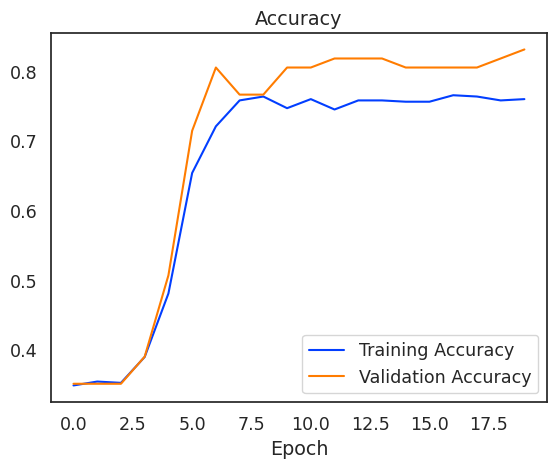

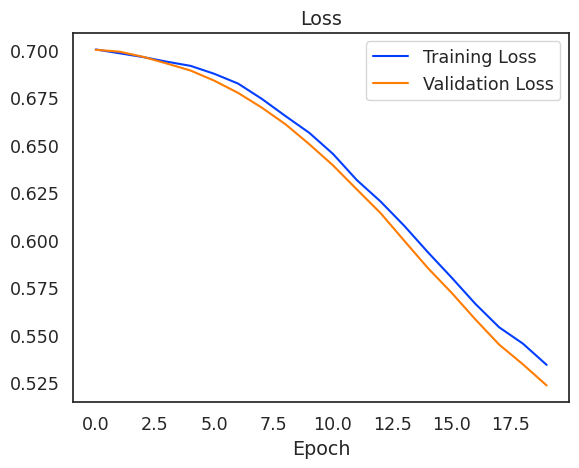

In [20]:
plt.plot(train_acc)
plt.plot(val_acc)
plt.legend(['Training Accuracy', 'Validation Accuracy'])
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.show()
plt.plot(train_loss)
plt.plot(val_loss)
plt.legend(['Training Loss', 'Validation Loss'])
plt.title('Loss')
plt.xlabel('Epoch')
plt.show()

In [21]:
labels = torch.tensor([])
preds = torch.tensor([])
model_ft.eval()
for batch_idx, data in enumerate(test_dataloader):
    # for inputs, labels in test_dataloader:
    inputs = data[0].to(device)
    labels_temp = data[1].to(device)
    with torch.no_grad():
        outputs = model_ft(inputs)
        preds_temp = torch.round(outputs)
    labels = torch.cat([labels, labels_temp.cpu()], dim=0)
    preds = torch.cat([preds, preds_temp.cpu()], dim=0)
    torch.cuda.empty_cache()

              precision    recall  f1-score   support

         0.0       0.77      0.85      0.81       100
         1.0       0.65      0.52      0.58        54

    accuracy                           0.73       154
   macro avg       0.71      0.68      0.69       154
weighted avg       0.73      0.73      0.73       154

confusion matrix=
 [[85 15]
 [26 28]]


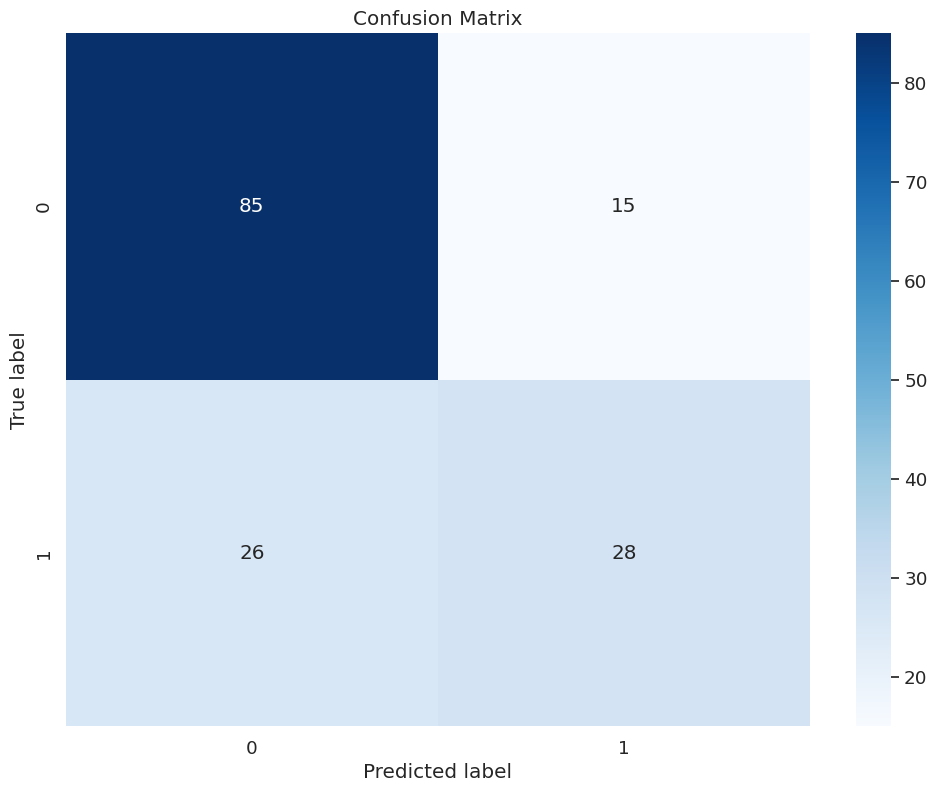

In [22]:
from sklearn.metrics import confusion_matrix , classification_report
report = classification_report(labels.cpu().numpy(), preds.cpu().numpy())
# Print the classification report
print(report)

confusion_mtx = confusion_matrix(labels.cpu().numpy(), preds.cpu().numpy())
print("confusion matrix=\n",confusion_mtx)
plt.figure(figsize=(12,9))
sns.set(font_scale=1.2)
sns.heatmap(confusion_mtx, annot=True,cmap="Blues", fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()

# Part 2

In [26]:
instance_idx = np.random.randint(0, len(X_test), 3)

## 4

In [27]:
def predict_proba_wrapper(instances):
    model_ft.eval()
    with torch.no_grad():
        if not torch.is_tensor(instances):
            instances = torch.tensor(instances, dtype=torch.float32)
        probabilities = model_ft(instances)
    return np.hstack((1 - probabilities.numpy(), probabilities.numpy()))

In [28]:
import lime
import lime.lime_tabular
# Create a LIME explainer
feature_names = X_train.columns.tolist()
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=feature_names, class_names=['0', '1'], discretize_continuous=True)

instance = X_test.values[instance_idx[0]]
# Explain the prediction
explanation = explainer.explain_instance(instance, predict_proba_wrapper, num_features=len(feature_names))
explanation.show_in_notebook()

instance = X_test.values[instance_idx[1]]
# Explain the prediction
explanation = explainer.explain_instance(instance, predict_proba_wrapper, num_features=len(feature_names))
explanation.show_in_notebook()

instance = X_test.values[instance_idx[2]]
# Explain the prediction
explanation = explainer.explain_instance(instance, predict_proba_wrapper, num_features=len(feature_names))
explanation.show_in_notebook()

## 5

In [33]:
import shap
shap.initjs()
# use Kernel SHAP to explain test set predictions
explainer = shap.KernelExplainer(predict_proba_wrapper, X_train.values, link="logit")

instance = X_test.values[instance_idx[0]]
shap_values = explainer.shap_values(instance, nsamples=100)
shap.force_plot(explainer.expected_value[0], shap_values[:,0], X_test.iloc[0,:], link="logit")

In [37]:
instance = X_test.values[instance_idx[1]]
shap.initjs()
shap_values = explainer.shap_values(instance, nsamples=100)
shap.force_plot(explainer.expected_value[0], shap_values[:,0], X_test.iloc[0,:], link="logit")

In [38]:
instance = X_test.values[instance_idx[2]]
shap.initjs()
shap_values = explainer.shap_values(instance, nsamples=100)
shap.force_plot(explainer.expected_value[0], shap_values[:,0], X_test.iloc[0,:], link="logit")

## 6

In [50]:
instance = X_test.values[instance_idx[2]]
instance[1] = 0.75
instance[2] = 0.1
instance[3] = 0.1
instance[4] = 0
shap.initjs()
shap_values = explainer.shap_values(instance, nsamples=100)
shap.force_plot(explainer.expected_value[0], shap_values[:,0], X_test.iloc[0,:], link="logit")

## 7

In [52]:
explainer = shap.KernelExplainer(predict_proba_wrapper, X_train.values, link="logit")
shap.initjs()
shap_values = explainer.shap_values(X_test.values, nsamples=100)
shap.force_plot(explainer.expected_value[0], shap_values.mean(axis=0)[:,0], X_test.iloc[0,:], link="logit")

  0%|          | 0/154 [00:00<?, ?it/s]

In [53]:
# Create a LIME explainer
feature_names = X_train.columns.tolist()
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=feature_names, class_names=['0', '1'], discretize_continuous=True)

instance = X_test.values[instance_idx[0]]
# Explain the prediction
explanation = explainer.explain_instance(instance, predict_proba_wrapper, num_features=len(feature_names))
explanation.show_in_notebook()

In [54]:
all_explanations = []

# Iterate over each instance in the test dataset
for instance in X_test.values:
    # Explain the prediction made by your PyTorch model for the current instance
    explanation = explainer.explain_instance(instance, predict_proba_wrapper, num_features=len(feature_names))
    # Append the explanation to the list
    all_explanations.append(explanation)

In [55]:
# Initialize an empty list to store feature importance for all instances
all_feature_importance = []

# Iterate over each explanation in the list of explanations
for explanation in all_explanations:
    # Get feature importance as a list of tuples (feature, weight)
    feature_importance = explanation.as_list()
    # Append feature importance for the current instance to the list
    all_feature_importance.append(feature_importance)

In [56]:
from collections import defaultdict

# Initialize a dictionary to store total feature importance for each feature
total_feature_importance = defaultdict(float)
# Initialize a dictionary to store the count of instances for each feature
feature_count = defaultdict(int)

# Iterate over each explanation in the list of explanations
for explanation in all_explanations:
    # Get feature importance as a list of tuples (feature, weight)
    feature_importance = explanation.as_list()
    # Update total feature importance and feature count for each feature
    for feature, weight in feature_importance:
        total_feature_importance[feature] += abs(weight)
        feature_count[feature] += 1

# Calculate the average feature importance for each feature
average_feature_importance = {}
for feature in total_feature_importance:
    average_feature_importance[feature] = total_feature_importance[feature] / feature_count[feature]

# Now average_feature_importance dictionary contains the average feature importance for each feature


In [57]:
average_feature_importance

{'Glucose > 0.62': 0.21115364115587112,
 'BMI <= 0.19': 0.0694111245120395,
 'BloodPressure <= 0.41': 0.02267626866114628,
 '0.07 < DiabetesPedigreeFunction <= 0.13': 0.015483745328311965,
 '0.13 < Age <= 0.32': 0.022078941042721484,
 'Pregnancies > 0.35': 0.01525563693632982,
 'Insulin <= 0.00': 0.004895960988908672,
 '0.20 < SkinThickness <= 0.24': 0.0057308858844243955,
 'Glucose <= 0.35': 0.1626172951642999,
 'Age > 0.32': 0.02676826295236004,
 '0.29 < BMI <= 0.38': 0.022534928375274856,
 'BloodPressure > 0.57': 0.013528757775248841,
 'SkinThickness <= 0.20': 0.007020081441957207,
 '0.05 < Insulin <= 0.15': 0.00398913396093531,
 '0.47 < Glucose <= 0.62': 0.024051224728679193,
 '0.49 < BloodPressure <= 0.57': 0.011235542507005584,
 '0.05 < Age <= 0.13': 0.009277597297371357,
 '0.13 < DiabetesPedigreeFunction <= 0.24': 0.0047727504245832645,
 '0.06 < Pregnancies <= 0.18': 0.0029377150117604464,
 'Insulin > 0.15': 0.00314377107143033,
 '0.35 < Glucose <= 0.47': 0.06851649777466051,
 '